<a href="https://colab.research.google.com/github/Martin09/DeepSEM/blob/master/segmentation-NWs/2_nw_seg_training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 2 - Model definition, training and saving
In this notebook we will:
1. Load and prepare our dataset.
2. Create and configure a pre-trained model from the detectron2 model zoo. 
3. Train our custom model on our dataset of labelled SEM images. 
4. Perform inference to test our model.
5. Save the model to a file for later use.

First, let's check that we are running a GPU instance of Colab:

In [1]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime -> "Change runtime type" menu to enable GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Tue Jun 30 09:00:49 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.36.06    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    36W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

If you see a prompt above to "Change runtime type" then you are not running a GPU instance. Follow the instructions above to enable the GPU.

## Install detectron2
We will be using Facebook's [detectron2](https://github.com/facebookresearch/detectron2) library to train our model. First we need to install it and its dependencies.

In [2]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
Requirement already up-to-date: torch==1.5 in /usr/local/lib/python3.6/dist-packages (1.5.0+cu101)
Requirement already up-to-date: torchvision==0.6 in /usr/local/lib/python3.6/dist-packages (0.6.0+cu101)
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-169iiyjw
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-169iiyjw
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-linux_x86_64.whl size=266989 sha256=d00fc16029441f6b16900df94dc5b30bdb53e82463649c220d93f492930717a0
  Stored in directory: /tmp/pip-ephem-wheel-cache-68smngt_/wheels/90/51/41/646daf401c3bc408ff10de34ec76587a9b3ebfac8d21ca5c3a
Successfully built pycocotools
  Found existing installation: pycocotools 2.0
    Uninstalling pycocotools-2.0:
      Successfully uninstalled pycocotools-2.0
1.5.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free

In [3]:
# install detectron2:
!pip install detectron2==0.1.2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html


In [4]:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# Import some common libraries
import numpy as np
import os, cv2, random, json, datetime, time, urllib, pycocotools
from glob import glob
from google.colab.patches import cv2_imshow
from PIL import Image
from pathlib import Path
from tqdm import tqdm

# Import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.structures import BoxMode

## Introduction
In this section, we will train an existing detectron2 model on our labelled SEM image dataset that we prepared in [Notebook 1](https://colab.research.google.com/github/Martin09/DeepSEM/blob/master/segmentation-NWs/1_nw_seg_image_prep.ipynb) and labelled with [Labelbox](https://labelbox.com). We will use a custom labelled nanowire detection dataset which can be downloaded [here](https://github.com/Martin09/DeepSEM/raw/master/segmentation-NWs/datasets/WJ_NWs_D1-17-02-17-C_processed.zip). This dataset has been labelled with three classes: 
*   Droplet
*   Nanowire
*   Parasitic

From this, we will train a custom image segmentation model from an existing model pre-trained on the COCO dataset, available in detectron2's model zoo.

Note: the COCO dataset does not have any of these categories by default so we will have to perform transfer learning to get the model to detect them.

## 2.1 - Preparing our dataset

In [5]:
class_dict = {'droplet': '1',
              'nanowire': '2',
              'parasitic': '3'}

dataset_dir = './DeepSEM/segmentation-NWs/datasets/WJ_NWs_D1-17-02-17-C_processed/'

In [6]:
# # Optional: Save everything to your own GoogleDrive
# from google.colab import drive
# drive.mount('/content/gdrive/')
# %cd "/content/gdrive/My Drive/path/to/save/location"

# Clone the DeepSEM repository
!rm -rf DeepSEM  # Remove folder if it already exists
!git clone https://github.com/Martin09/DeepSEM

Cloning into 'DeepSEM'...
remote: Enumerating objects: 69, done.
remote: Counting objects: 100% (69/69), done.
remote: Compressing objects: 100% (67/67), done.
remote: Total 646 (delta 37), reused 5 (delta 2), pack-reused 577
Receiving objects: 100% (646/646), 166.93 MiB | 23.77 MiB/s, done.
Resolving deltas: 100% (314/314), done.


To make things easier, I have already prepared a labelled dataset and put it in a handy .zip file. Next, let's unzip this dataset to use it for training.

In [7]:
!wget https://github.com/Martin09/DeepSEM/raw/master/segmentation-NWs/datasets/WJ_NWs_D1-17-02-17-C_processed.zip
!unzip WJ_NWs_D1-17-02-17-C_processed.zip -d $dataset_dir
!rm WJ_NWs_D1-17-02-17-C_processed.zip

--2020-06-30 09:01:28--  https://github.com/Martin09/DeepSEM/raw/master/segmentation-NWs/datasets/WJ_NWs_D1-17-02-17-C_processed.zip
Resolving github.com (github.com)... 140.82.118.3
Connecting to github.com (github.com)|140.82.118.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/Martin09/DeepSEM/master/segmentation-NWs/datasets/WJ_NWs_D1-17-02-17-C_processed.zip [following]
--2020-06-30 09:01:29--  https://raw.githubusercontent.com/Martin09/DeepSEM/master/segmentation-NWs/datasets/WJ_NWs_D1-17-02-17-C_processed.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8625972 (8.2M) [application/zip]
Saving to: ‘WJ_NWs_D1-17-02-17-C_processed.zip’

WJ_NWs_D1-17-02-17- 100%[===================>]   8.23M 

Alternatively, you can download and build up the dataset from a LabelBox JSON export file from scratch. The script below will build up the same file structure using a LabelBox JSON export file. Downloading takes about 30s/image, depending on size and number of segmentation masks.

In [8]:
# # Define a small helper function to download images from Labelbox
# def get_image(img_url):
#   counter = 0
#   while(True):
#     try:
#       counter += 1
#       time.sleep(0.2)  # To not overload the LabelBox servers with requests
#       image = Image.open(urllib.request.urlopen(img_url))
#       return image
#     except HTTPError:
#       if counter > 10:
#         print('Image download failed 10 times in a row!')
#         raise

# # Load json data
# json_file = "./DeepSEM/segmentation-NWs/datasets/export-2020-06-11T13_11_45.691Z.json"
# with open(json_file) as f:
#     data = json.load(f)

# # Perform test/train split by random choice
# n_images = len(data)
# i_test = np.random.choice(list(range(n_images)), int(n_images*0.1), replace=False)

# # Loop over all the images (one image per row)
# for i, img in enumerate(tqdm(data, unit='image')):
#     image_name = img['External ID']

#     # Output image into test and train directories randomly
#     if i in i_test:
#         example_dest_dir = dataset_dir + 'test/' + image_name.split(".")[0] + '/'
#     else:
#         example_dest_dir = dataset_dir + 'train/' + image_name.split(".")[0] + '/'

#     # If there are labels for this image, create a folder for it and save the image
#     if img['Label']['objects'] and len(img['Label']['objects']) > 0:
#         Path(example_dest_dir + 'images/').mkdir(parents=True, exist_ok=True)
#         image_url = img['Labeled Data']
#         image = get_image(image_url)
#         image.save(example_dest_dir + 'images/' + image_name)
    
#     # For each label, download the mask PNG file from labelbox and save it to relevant path
#     for label in img['Label']['objects']:
#         mask_class = class_dict[label['value']]
#         mask_name = label['featureId']
#         mask_url = label['instanceURI']

#         mask_dest_dir = example_dest_dir + 'masks/' + mask_class + '/'
#         Path(mask_dest_dir).mkdir(parents=True, exist_ok=True)
#         mask = get_image(mask_url)
#         mask.save(mask_dest_dir + mask_name +'.png', bit=1)

## Calculate mean pixel intensity of dataset



In [9]:
# Calcualte dataset mean pixel intensity
images = glob(dataset_dir + '/train/*/images/*.png', recursive=True)

min_pixel_intensity = np.infty
max_pixel_intensity = -np.infty
mean_pixel_intensity = 0
for img in images:
    im = cv2.imread(img,cv2.IMREAD_GRAYSCALE)
    min_pixel_intensity = min([np.min(im), min_pixel_intensity])
    max_pixel_intensity = max([np.max(im), max_pixel_intensity])
    mean_pixel_intensity += np.mean(im)
mean_pixel_intensity /= len(images)

print('The min pixel intesity is: {:.2f}'.format(min_pixel_intensity))
print('The max pixel intesity is: {:.2f}'.format(max_pixel_intensity))
print('The mean pixel intesity is: {:.2f}'.format(mean_pixel_intensity))
mpi = float(mean_pixel_intensity)

The min pixel intesity is: 30.00
The max pixel intesity is: 255.00
The mean pixel intesity is: 95.49


Register the nanowire dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. See the tutorial for more details.


In [10]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_test", {}, "json_annotation_test.json", "path/to/image/dir")

def get_bbox(msk):
    rows = np.any(msk, axis=1)
    cols = np.any(msk, axis=0)
    ymin, ymax = np.where(rows)[0][[0, -1]]
    xmin, xmax = np.where(cols)[0][[0, -1]]
    return xmin, ymin, xmax, ymax

def get_nw_mask_dicts_from_labelbox(dataset_folder):

    dataset_dicts = []
    for idx, entry in enumerate(os.scandir(dataset_folder)):
        if entry.is_file():
            continue
        
        image_file = next(os.scandir(entry.path+'/images'))
        
        record = {}
        record["image_id"] = idx
        record["file_name"] = image_file.path
        
        height, width = cv2.imread(image_file.path).shape[:2]
        record["height"] = height
        record["width"] = width    

        objs = []
        for category in os.scandir(entry.path+'/masks'):
            for mask_file in os.scandir(category.path):

                mask = cv2.imread(mask_file.path, cv2.IMREAD_GRAYSCALE)
                mask = (mask/mask.max()).astype(np.uint8)  # Convert to integer mask
                try:
                    obj = {
                        "bbox": list(get_bbox(mask)),
                        "bbox_mode": BoxMode.XYXY_ABS,
                        "segmentation": pycocotools.mask.encode(np.asarray(mask, order="F")),
                        "category_id": int(category.name)-1,
                    }
                except IndexError: # Can happen if we have an emtpy mask and try to find its bbox, for example
                    continue
                objs.append(obj)
            record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

Now we register the train and test datasets in detectron2:

In [11]:
from detectron2.data import DatasetCatalog, MetadataCatalog
DatasetCatalog.clear()

for d in ["train", "test"]:
    DatasetCatalog.register("nw_masks_" + d, lambda d=d: get_nw_mask_dicts_from_labelbox(dataset_dir + '/' + d))
    MetadataCatalog.get("nw_masks_" + d).set(thing_classes=list(class_dict))
nanowire_metadata = MetadataCatalog.get("nw_masks_train")

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in true_divide


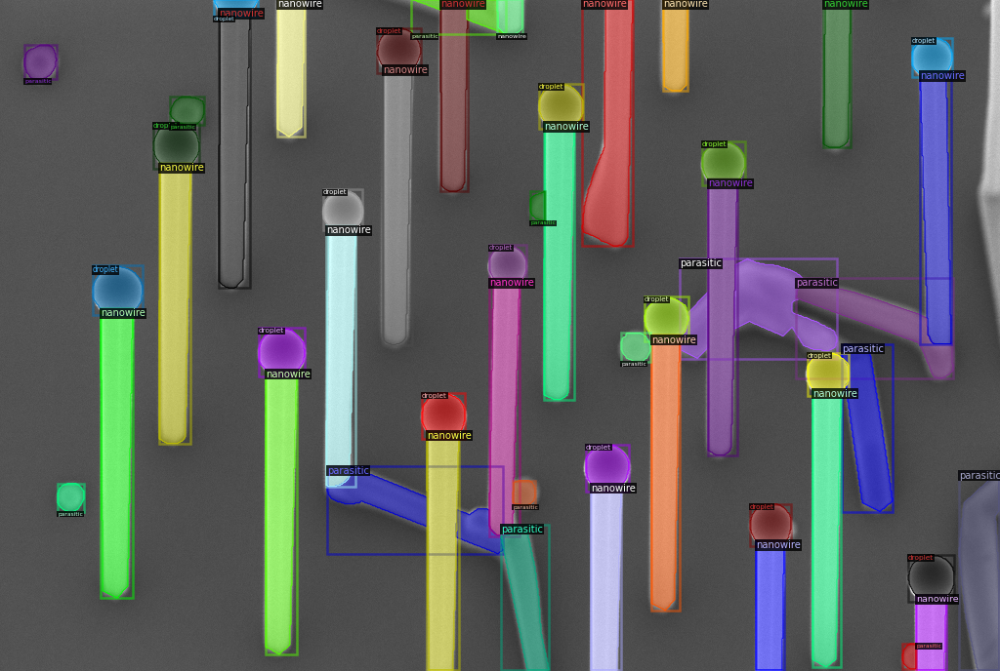

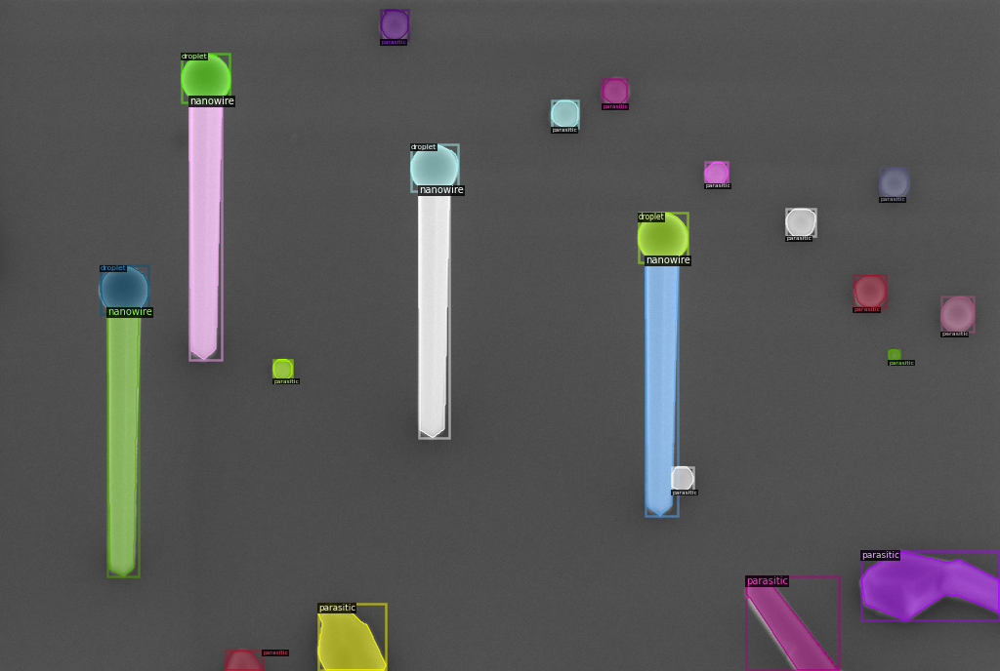

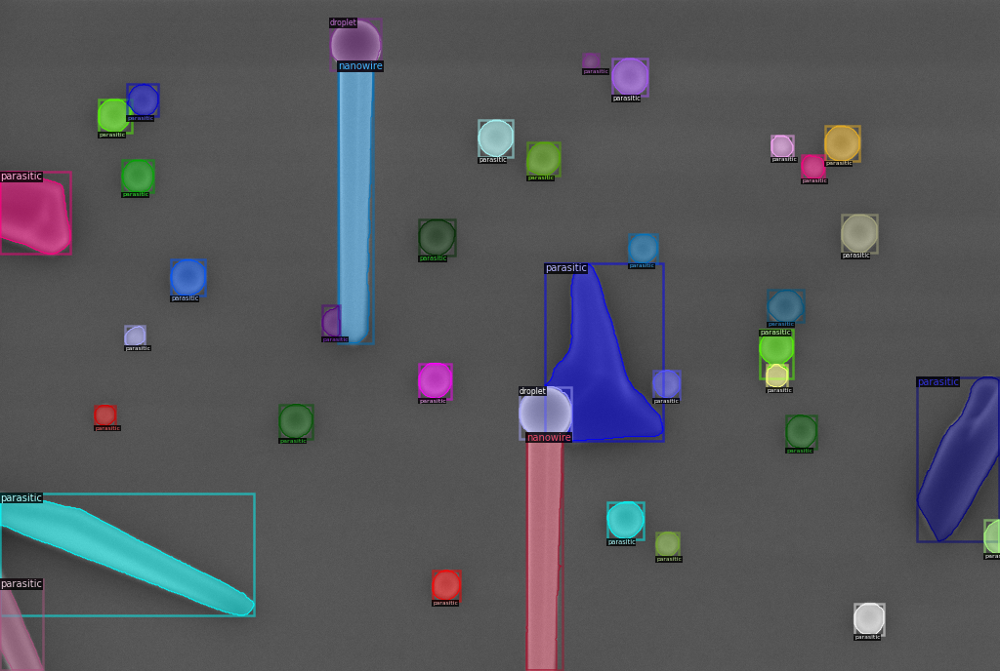

In [12]:
dataset_dicts = get_nw_mask_dicts_from_labelbox(dataset_dir + "/train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])

    visualizer = Visualizer(img[:, :, ::-1], metadata=nanowire_metadata, scale=1.0)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## 2.2 - Model definition

Now, we will load a COCO-pretrained RR50-FPN Mask R-CNN model from the [detectron2 model zoo](https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md). We will then modify its configuration settings in order to adapt it for transfer learning on our SEM dataset.

In [13]:
timestamp = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
output_dir = './DeepSEM/segmentation-NWs/output/' + timestamp

cfg = get_cfg()
cfg.OUTPUT_DIR = output_dir
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.INPUT.MASK_FORMAT='bitmask'
cfg.DATASETS.TRAIN = ("nw_masks_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 8
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 8
cfg.SOLVER.BASE_LR = 0.05  # learning rate
cfg.SOLVER.MAX_ITER = 100  # 1000 is decent for initial testing
cfg.SOLVER.CHECKPOINT_PERIOD = 5000  # Save a checkpoint after every this number of iterations

# Learning rate warmup and decay
cfg.SOLVER.WARMUP_FACTOR = 1/1000.  # Learning starts at BASE_LR * WU_FACTOR
cfg.SOLVER.WARMUP_ITERS = 1000  # Number of iterations for warm-up phase
cfg.SOLVER.WARMUP_METHOD = "linear"
cfg.SOLVER.GAMMA = 0.5
# cfg.SOLVER.STEPS = (100,200,300,)  # List of iteration numbers at which to decrease learning rate by factor GAMMA.
cfg.SOLVER.STEPS = tuple(range(0,cfg.SOLVER.MAX_ITER,2000)) # Decrease LR every 1000 steps

# Don't scale the input images
cfg.INPUT.MIN_SIZE_TRAIN = (0,)  # Keep these data types or might run into issues during inference when loading config file
cfg.INPUT.MAX_SIZE_TRAIN = 99999  # Keep these data types or might run into issues during inference when loading config file

cfg.MODEL.PIXEL_MEAN = [mpi, mpi, mpi] 
cfg.MODEL.PIXEL_STD = [1.0, 1.0, 1.0]
cfg.MODEL.ROI_HEADS.IOU_THRESHOLDS = [0.5] # Intersection over union threshold
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(class_dict) # We have three classification classes 

We can start up tensorboard to monitor training progress in realtime.

In [14]:
# Look at training curves in tensorboard:
%load_ext tensorboard
# %reload_ext tensorboard
%tensorboard --logdir ./DeepSEM/segmentation-NWs/output

<IPython.core.display.Javascript object>

## 2.3 - Training
It takes ~2 minutes to train 100 iterations on Colab Pro's Tesla P100 GPUs and a bit longer on Colab's free Tesla K80 GPUs.

In [15]:
# Start training
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[06/30 09:01:49 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in true_divide


[06/30 09:01:54 d2.data.build]: Removed 0 images with no usable annotations. 21 images left.
[06/30 09:01:54 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|  droplet   | 191          |  nanowire  | 228          | parasitic  | 411          |
|            |              |            |              |            |              |
|   total    | 830          |            |              |            |              |
[06/30 09:01:54 d2.data.common]: Serializing 21 elements to byte tensors and concatenating them all ...
[06/30 09:01:54 d2.data.common]: Serialized dataset takes 0.20 MiB
[06/30 09:01:54 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(0,), max_size=99999, sample_style='choice'), RandomFlip()]
[06/30 09:01:54 d2.data.build]: Using training sampl

Unable to load 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (4, 1024) in the model!
Unable to load 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (12, 1024) in the model!
Unable to load 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model!
Unable to load 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (3, 256, 1, 1) in the model!
Unable to load 'roi_heads.mask_head.predictor.bias' to the model due to incompatible shapes: (80,) in the checkpoint but (3,) in the model!


[06/30 09:01:56 d2.engine.train_loop]: Starting training from iteration 0
[06/30 09:02:34 d2.utils.events]:  eta: 0:02:19  iter: 19  total_loss: 2.486  loss_cls: 0.841  loss_box_reg: 0.720  loss_mask: 0.639  loss_rpn_cls: 0.129  loss_rpn_loc: 0.183  time: 1.7375  data_time: 0.1854  lr: 0.000500  max_mem: 12542M
[06/30 09:03:09 d2.utils.events]:  eta: 0:01:45  iter: 39  total_loss: 1.656  loss_cls: 0.492  loss_box_reg: 0.692  loss_mask: 0.287  loss_rpn_cls: 0.051  loss_rpn_loc: 0.130  time: 1.7390  data_time: 0.0617  lr: 0.000999  max_mem: 12547M
[06/30 09:03:43 d2.utils.events]:  eta: 0:01:10  iter: 59  total_loss: 1.054  loss_cls: 0.254  loss_box_reg: 0.501  loss_mask: 0.163  loss_rpn_cls: 0.030  loss_rpn_loc: 0.116  time: 1.7353  data_time: 0.0570  lr: 0.001499  max_mem: 12547M
[06/30 09:04:18 d2.utils.events]:  eta: 0:00:36  iter: 79  total_loss: 0.732  loss_cls: 0.176  loss_box_reg: 0.303  loss_mask: 0.128  loss_rpn_cls: 0.028  loss_rpn_loc: 0.108  time: 1.7390  data_time: 0.0549  

Hopefully, during training you should start to see the `total_loss` decreasing over time as the model learns. Initially, the learning rate (`lr`) will increase during the warm-up stage for 1000 iterations. After which it will be halved every 1000 iterations until the end of training. These settings can all be changed in the config (`cgf.XX = X`) definitions above. As a proof of concept, I have set `cfg.SOLVER.MAX_ITER=100` but you should increase this to 1000 or even 10000 to achieve the best performance.

## 2.4 - Inference with a trained model
Now, let's run inference with the trained model on the test dataset. First, let's create a predictor using the model we just trained:



In [16]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # Set the testing threshold for this model
cfg.MODEL.ROI_HEADS.NMS_THRESH_TEST = 0.2     # Non-max supression threshold
cfg.DATASETS.TEST = ("nw_masks_test", )
cfg.TEST.DETECTIONS_PER_IMAGE = 200
cfg.INPUT.MIN_SIZE_TEST = 0
cfg.INPUT.MAX_SIZE_TEST = 99999
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

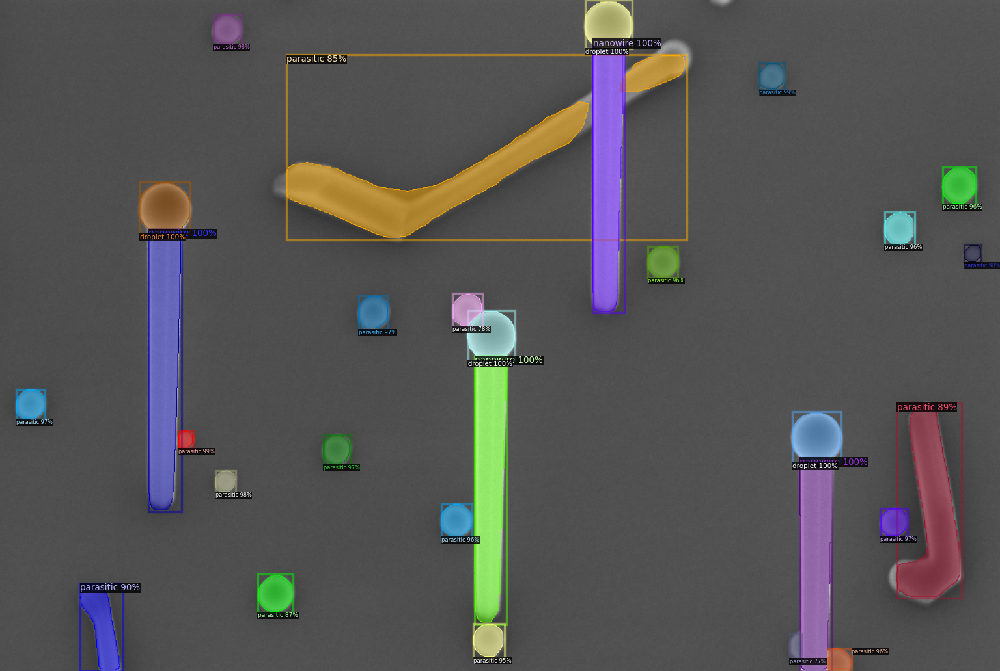

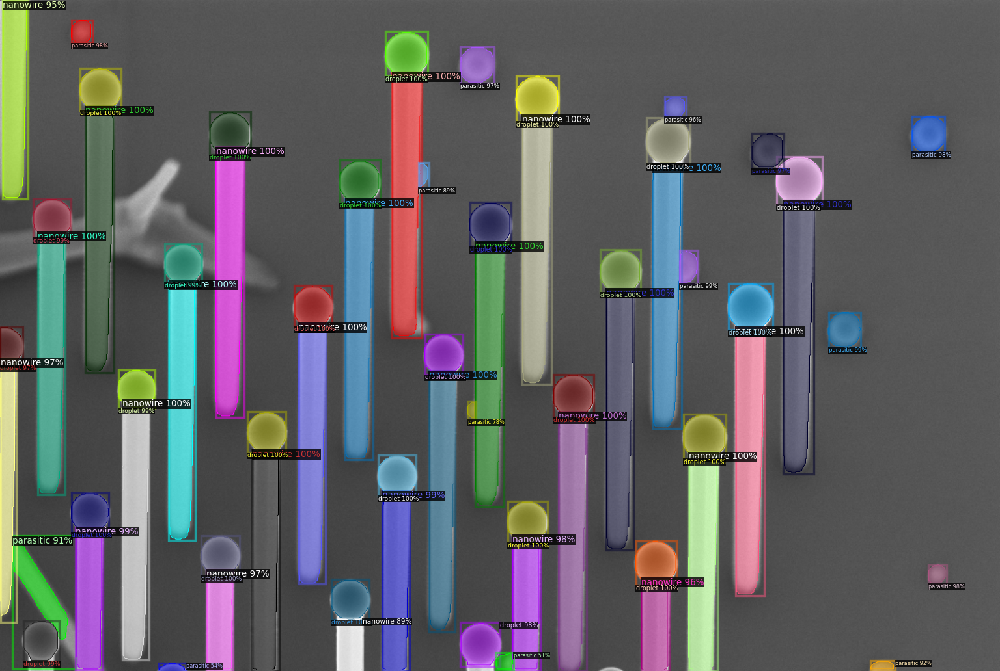

In [17]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_nw_mask_dicts_from_labelbox(dataset_dir + "/test")
for d in random.sample(dataset_dicts, 2):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=nanowire_metadata, 
                   scale=1.5, 
                  #  instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

We can see that already, even with just a few hundred training iterations, thanks to transfer learning on a pre-trained network, the model already achieves quite good performance! As you train for longer, the predictions will get even more accurate. At >10k training iterations the model should achieve near human-level performance.

In [18]:
# # Check the outputs of the neural network manually:
# outputs["instances"].pred_boxes
# outputs["instances"].scores
# outputs["instances"].pred_classes

We can also evaluate its performance using AP metric implemented in COCO API. [not working yet]

In [19]:
# ## Not working yet
# from detectron2.evaluation import COCOEvaluator, inference_on_dataset
# from detectron2.data import build_detection_test_loader
# evaluator = COCOEvaluator("nw_masks_train", cfg, False)#, output_dir="./output/")
# test_loader = build_detection_test_loader(cfg, "nw_masks_train")
# inference_on_dataset(trainer.model, test_loader, evaluator)
# # another equivalent way is to use trainer.test

## 2.5 - Saving the trained model
Now let's save our final model for safe keeping to use it in the next notebook.

In [20]:
weights_source = cfg.OUTPUT_DIR + '/model_final.pth'
model_name = 'nw_seg_it'+str(trainer.iter)+'_loss0.XXX.yaml'
model_dest = './DeepSEM/segmentation-NWs/trained_models/' + model_name

# Move weights file to "trained_models" folder and update the config file accordingly
weights_dest = model_dest[:-5] + '.pth'
!cp $weights_source $weights_dest
cfg.MODEL.WEIGHTS = weights_dest

# Save the config file alongside the weights file
confi_dest = model_dest
with open(confi_dest, "w") as text_file:
    text_file.write(cfg.dump())

## A final note on overfitting
In this example we are only monitoring the training loss as a function of iterations. This has the disadvantage that we do not know if our model is over-fitting to our training set. In this simple application we don't worry about overfitting too much, especially as the model seems to perform well on the test set after training. However, to achieve the best possible performance, we should create a small third dataset called a validation set with which we periodically estimate the performance of the model during training. Training should then be stopped when validation loss stops decreasing to prevent overfitting on the training set.

Next, in [Notebook 3](https://colab.research.google.com/github/Martin09/DeepSEM/blob/master/segmentation-NWs/3_nw_seg_inference.ipynb), let's see how we can apply our trained model to some raw SEM images and then use the output to plot some nanowire size distributions!